In [143]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-tdqd_p70
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-tdqd_p70
  Resolved https://github.com/openai/CLIP.git to commit a9b1bf5920416aaeaec965c25dd9e8f98c864f16
  Preparing metadata (setup.py) ... done


In [144]:
import random
import torch.nn.functional as F
from sklearn.metrics import accuracy_score
from tqdm import tqdm
import cv2
import torch.nn as nn
import numpy as np
import torch
import os
from PIL import Image
import clip
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
from pkg_resources import packaging
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn import metrics
from torch.autograd import Variable
import os
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from sklearn.model_selection import train_test_split

In [145]:
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [146]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-L/14@336px", device=device)
model.cuda().eval()

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (ln_pre): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
          )
          (ln_1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=1024, out_features=4096, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=4096, out_features=1024, bias=True)
          )
          (ln_2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)


In [147]:
train_path= "/kaggle/input/vizwiz/Annotations/Annotations/train.json"
val_path= "/kaggle/input/vizwiz/Annotations/Annotations/val.json"
test_path = "/kaggle/input/vizwiz/Annotations/Annotations/test.json"

with open(train_path) as f:
    train_data = json.load(f)
with open(val_path) as f:
    val_data = json.load(f)
with open(test_path) as f:
    test_data = json.load(f)

path_train_images="/kaggle/input/vizwiz/train/train"
path_val_images="/kaggle/input/vizwiz/val/val"
path_test_images="/kaggle/input/vizwiz/test/test"

train=pd.DataFrame(train_data)
val=pd.DataFrame(val_data)
test=pd.DataFrame(test_data)

print(train.shape)
print(val.shape)
print(test.shape)

(20523, 5)
(4319, 5)
(8000, 2)


In [148]:
random.seed(42)
X_train, X_test, y_train, y_test = train_test_split(train.iloc[:,[0,1,2,4]],train.iloc[:,3], test_size=0.05, random_state=42)
print(X_train.shape)
print(X_test.shape)

(19496, 4)
(1027, 4)


In [149]:
import Levenshtein
words = []
pictures = []
train_answers = []
for i in range(X_train.iloc[:]['question'].size):
    all_answers = X_train.iloc[i]['answers']
    answer_values = [answer['answer'] for answer in all_answers]
    mode_answer = max(set(answer_values), key=answer_values.count)  # Get mode answer
    if answer_values.count(mode_answer) > 1:
        # If there are ties, choose the mode answer with the smallest Levenshtein distance
        mode_answers = [answer for answer in answer_values if answer == mode_answer]
        levenshtein_distances = [Levenshtein.distance(mode_answer, answer) for answer in mode_answers]
        mode_answer = mode_answers[levenshtein_distances.index(min(levenshtein_distances))]
    train_answers.append(mode_answer)  # Append mode answer to answers list
    words.append(X_train.iloc[i]['question'])
    pictures.append(X_train.iloc[i]['image'])
train_answers=np.array(train_answers)
train_unique_answers = np.unique(train_answers)
print(train_answers.shape)
print(train_unique_answers.shape)

(19496,)
(5480,)


In [150]:
import Levenshtein
words = []
pictures = []
val_answers = []
for i in range(val.iloc[:]['question'].size):
    all_answers = val.iloc[i]['answers']
    answer_values = [answer['answer'] for answer in all_answers]
    mode_answer = max(set(answer_values), key=answer_values.count)  # Get mode answer
    if answer_values.count(mode_answer) > 1:
        # If there are ties, choose the mode answer with the smallest Levenshtein distance
        mode_answers = [answer for answer in answer_values if answer == mode_answer]
        levenshtein_distances = [Levenshtein.distance(mode_answer, answer) for answer in mode_answers]
        mode_answer = mode_answers[levenshtein_distances.index(min(levenshtein_distances))]
    val_answers.append(mode_answer)  # Append mode answer to answers list
    words.append(val.iloc[i]['question'])
    pictures.append(val.iloc[i]['image'])
val_answers=np.array(val_answers)
val_unique_answers = np.unique(val_answers)
print(val_answers.shape)
print(val_unique_answers.shape)

(4319,)
(1511,)


In [151]:
import Levenshtein
words = []
pictures = []
test_answers = []
for i in range(X_test.iloc[:]['question'].size):
    all_answers = X_test.iloc[i]['answers']
    answer_values = [answer['answer'] for answer in all_answers]
    mode_answer = max(set(answer_values), key=answer_values.count)  # Get mode answer
    if answer_values.count(mode_answer) > 1:
        # If there are ties, choose the mode answer with the smallest Levenshtein distance
        mode_answers = [answer for answer in answer_values if answer == mode_answer]
        levenshtein_distances = [Levenshtein.distance(mode_answer, answer) for answer in mode_answers]
        mode_answer = mode_answers[levenshtein_distances.index(min(levenshtein_distances))]
    test_answers.append(mode_answer)  # Append mode answer to answers list
test_answers=np.array(test_answers)
test_unique_answers = np.unique(test_answers)
print(test_answers.shape)
print(test_unique_answers.shape)

(1027,)
(502,)


In [152]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
one_hot_encoder = OneHotEncoder(sparse=False)
one_hot_encoder=one_hot_encoder.fit(train_answers.reshape(-1, 1))
one_hot_encoded_train=one_hot_encoder.transform(train_answers.reshape(-1, 1))
print(one_hot_encoded_train.shape)

temp=-1*np.ones([1, one_hot_encoded_train.shape[1]])
encoded_labels=[]
for ans in (val_answers):
    try:
        encoded_labels.append(one_hot_encoder.transform(ans))
    except ValueError as e:
        encoded_labels.append(temp)
one_hot_encoded_val=np.array(encoded_labels)
x=one_hot_encoded_val.shape
one_hot_encoded_val=np.reshape(one_hot_encoded_val, (x[0], x[2]))
print(one_hot_encoded_val.shape)


encoded_labels=[]
for ans in (test_answers):
    try:
        encoded_labels.append(one_hot_encoder.transform(ans))
    except ValueError as e:
        encoded_labels.append(temp)
one_hot_encoded_test=np.array(encoded_labels)
x=one_hot_encoded_test.shape
one_hot_encoded_test=np.reshape(one_hot_encoded_test, (x[0], x[2]))
print(one_hot_encoded_test.shape)


/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


(19496, 5480)
(4319, 5480)
(1027, 5480)


In [153]:
class myDataset(Dataset):
    def __init__(self, array,label):
        self.array = array
        self.label = label
          # stuff
      
    def __getitem__(self, index):
          # stuff
        return self.array[index].cuda(),torch.tensor(self.label[index]).cuda()

    def __len__(self):
        return len(self.array) # of how many examples(images?) you have

In [154]:
class Classifier(nn.Module):
    def __init__(self, input_dim,vocab_size,answer_types):
        super(Classifier, self).__init__()
        self.norm = nn.LayerNorm(input_dim).float()
        self.linear1 = nn.Linear(input_dim,512)
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(512,input_dim)
        self.linear2=nn.Linear(input_dim,vocab_size)
        self.Aux_linear=nn.Linear(input_dim,answer_types)
        self.Aux_linear2=nn.Linear(answer_types,vocab_size)
        self.Aux_signmod=nn.Sigmoid()

    def forward(self, combined_features):
        combined_features=combined_features.to(torch.float)
        x = self.norm(combined_features)
        linearlayer_input = self.linear1(x)
        x = self.dropout(linearlayer_input)
        linearlayer_output = self.fc1(x)
        Answers=self.linear2(linearlayer_output)
        Aux_input=self.Aux_linear(linearlayer_output)
        Aux_output=self.Aux_linear2(Aux_input)
        Answers_Mask=self.Aux_signmod(Aux_output)
        return Answers.cuda(),Answers_Mask.cuda()

In [155]:
def run_model(linearmodel,dataloader,valdataloader,input_dim, optimizer,train = True ):
    if train:
        linearmodel.train()
    pred = []
    labels = []
    linearmodel=linearmodel.cuda()
    loss = nn.CrossEntropyLoss().cuda()
    total_loss_train = 0
    total_loss_train_answer = 0
    total_loss_train_answer_mask=0
    accuracy=0
    model.train()
    for (combined_features,label) in tqdm(dataloader):

        optimizer.zero_grad()
        
        answer,answer_mask = linearmodel(combined_features.cuda())

        dim=answer.shape
        answer=torch.reshape(answer, (dim[0], dim[1])).cuda()
        answer_mask=torch.reshape(answer_mask, (dim[0], dim[1])).cuda()
        answer_output=answer*answer_mask
        
        
        label=label.cuda()
        loss_answer = loss(answer, label)
        loss_answermask= loss(answer_mask, label)
        total=loss_answer+loss_answermask
        #print(f"{total} {loss_answer} {loss_answermask}")
        total_loss_train_answer+=loss_answer
        total_loss_train_answer_mask+=loss_answermask
        total_loss_train += total
        #print(f"{total_loss_train} {total} {loss_answer} {loss_answermask}")
        total.backward()
        optimizer.step()
        

        softmax_output = torch.nn.functional.softmax(answer_output, dim=1).cuda()
        max_indices = torch.argmax(softmax_output, dim=1).cuda()
        one_hot_matrix = torch.eye(answer.shape[1]).cuda()
        one_hot_answer = one_hot_matrix[max_indices].cuda()


        np_label=label.cpu().detach()
        np_answer=one_hot_answer.cpu().detach()
        answer_accuracy=accuracy_score(np_label, np_answer)
        accuracy+=answer_accuracy

    return (accuracy/len(dataloader))*100,(total_loss_train/len(dataloader)),(total_loss_train_answer/len(dataloader)),(total_loss_train_answer_mask/len(dataloader))
    

In [156]:
train_array=torch.load("/kaggle/input/vqadata/combined_features.pt").cuda()
val_array=torch.load("/kaggle/input/vqadata-val/val_combined_features.pt").cuda()
test_array=torch.load("/kaggle/input/vqadata-test/test_combined_features.pt").cuda()

label_train=one_hot_encoded_train
label_val=one_hot_encoded_val
label_test=one_hot_encoded_test

train_data=myDataset(train_array,label_train)
val_data=myDataset(val_array,label_val)
test_data=myDataset(test_array,label_test)

batchsize=64

train_dataloader = DataLoader(train_data, batch_size=batchsize,shuffle=True, num_workers=0)
val_dataloader = DataLoader(val_data, batch_size=batchsize,shuffle=True, num_workers=0)
test_dataloader=DataLoader(test_data, batch_size=batchsize,shuffle=True, num_workers=0)


In [171]:
accuracyarray,train_lossarray, loss_answerarray,loss_answer_maskarray = [],[],[],[]

input_dim = 1536
vocab_size=len(train_unique_answers)
answer_types=4

linear_classifier=Classifier(input_dim,vocab_size,answer_types).cuda()

epoch = 100

optimizer = torch.optim.Adam(linear_classifier.parameters(), lr=0.0001, weight_decay=.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, factor=.3, threshold=1e-4)

for e in range(epoch):
    train_accuracy,loss_train,train_answer_loss,train_answermask_loss=run_model(linear_classifier,train_dataloader,val_dataloader,input_dim,optimizer)
    accuracyarray.append(train_accuracy)
    train_lossarray.append(loss_train.cpu().detach().numpy())
    loss_answerarray.append(train_answer_loss.cpu().detach().numpy())
    loss_answer_maskarray.append(train_answermask_loss.cpu().detach().numpy())
    print(f"epoch {e}")
    print(f"training accuracy: {train_accuracy}%")
    print(f"Total traning loss : {loss_train}")
    print(f"Total answer training loss : {train_answer_loss}")
    print(f"Total answermask training loss : {train_answermask_loss}")

100%|██████████| 305/305 [00:21<00:00, 14.11it/s]


epoch 0
training accuracy: 22.462090163934427%
Total traning loss : 14.247596139869227
Total answer training loss : 5.746856069037649
Total answermask training loss : 8.50074007083158


100%|██████████| 305/305 [00:22<00:00, 13.46it/s]


epoch 1
training accuracy: 26.98565573770492%
Total traning loss : 13.388086489727653
Total answer training loss : 4.92813753312279
Total answermask training loss : 8.459948956604864


100%|██████████| 305/305 [00:22<00:00, 13.82it/s]


epoch 2
training accuracy: 29.21823770491803%
Total traning loss : 12.914246441372546
Total answer training loss : 4.480863959039285
Total answermask training loss : 8.433382482333261


100%|██████████| 305/305 [00:21<00:00, 14.01it/s]


epoch 3
training accuracy: 31.026639344262293%
Total traning loss : 12.501744495755258
Total answer training loss : 4.088869591079695
Total answermask training loss : 8.412874904675563


100%|██████████| 305/305 [00:21<00:00, 14.09it/s]


epoch 4
training accuracy: 32.099385245901644%
Total traning loss : 12.1232754325098
Total answer training loss : 3.726422403768761
Total answermask training loss : 8.396853028741038


100%|██████████| 305/305 [00:21<00:00, 14.32it/s]


epoch 5
training accuracy: 33.20184426229508%
Total traning loss : 11.751557172420501
Total answer training loss : 3.371876320966861
Total answermask training loss : 8.37968085145364


100%|██████████| 305/305 [00:21<00:00, 14.31it/s]


epoch 6
training accuracy: 34.77561475409836%
Total traning loss : 11.377525179551329
Total answer training loss : 3.0161711770970876
Total answermask training loss : 8.361354002454242


100%|██████████| 305/305 [00:21<00:00, 14.21it/s]


epoch 7
training accuracy: 36.60553278688524%
Total traning loss : 11.026850716821214
Total answer training loss : 2.6842782148452318
Total answermask training loss : 8.342572501975981


100%|██████████| 305/305 [00:21<00:00, 14.31it/s]


epoch 8
training accuracy: 37.43032786885246%
Total traning loss : 10.690152170451391
Total answer training loss : 2.3674524010482774
Total answermask training loss : 8.322699769403114


100%|██████████| 305/305 [00:21<00:00, 14.16it/s]


epoch 9
training accuracy: 38.9764344262295%
Total traning loss : 10.400014128048655
Total answer training loss : 2.098932305763746
Total answermask training loss : 8.30108182228491


100%|██████████| 305/305 [00:21<00:00, 14.26it/s]


epoch 10
training accuracy: 39.908811475409834%
Total traning loss : 10.127371087722935
Total answer training loss : 1.850691678469142
Total answermask training loss : 8.276679409253793


100%|██████████| 305/305 [00:21<00:00, 14.45it/s]


epoch 11
training accuracy: 41.638319672131146%
Total traning loss : 9.893097603655656
Total answer training loss : 1.6409771347900042
Total answermask training loss : 8.252120468865652


100%|██████████| 305/305 [00:21<00:00, 14.30it/s]


epoch 12
training accuracy: 42.740778688524586%
Total traning loss : 9.703310986707868
Total answer training loss : 1.4767836417081242
Total answermask training loss : 8.226527344999743


100%|██████████| 305/305 [00:21<00:00, 14.28it/s]


epoch 13
training accuracy: 43.30020491803279%
Total traning loss : 9.548362327991324
Total answer training loss : 1.346140020119724
Total answermask training loss : 8.2022223078716


100%|██████████| 305/305 [00:21<00:00, 14.28it/s]


epoch 14
training accuracy: 44.23872950819672%
Total traning loss : 9.430717680653954
Total answer training loss : 1.2504332668267077
Total answermask training loss : 8.180284413827248


100%|██████████| 305/305 [00:21<00:00, 14.18it/s]


epoch 15
training accuracy: 44.32172131147541%
Total traning loss : 9.314552561974255
Total answer training loss : 1.1541538835464178
Total answermask training loss : 8.160398678427837


100%|██████████| 305/305 [00:21<00:00, 14.27it/s]


epoch 16
training accuracy: 45.00922131147541%
Total traning loss : 9.241684058091904
Total answer training loss : 1.0995718281417886
Total answermask training loss : 8.142112229950115


100%|██████████| 305/305 [00:21<00:00, 14.38it/s]


epoch 17
training accuracy: 45.20286885245902%
Total traning loss : 9.166556825826301
Total answer training loss : 1.0395490047021936
Total answermask training loss : 8.127007821124108


100%|██████████| 305/305 [00:21<00:00, 14.22it/s]


epoch 18
training accuracy: 45.25819672131147%
Total traning loss : 9.111456750065681
Total answer training loss : 0.9969637595396612
Total answermask training loss : 8.11449299052602


100%|██████████| 305/305 [00:21<00:00, 14.30it/s]


epoch 19
training accuracy: 46.08709016393443%
Total traning loss : 9.053060787772411
Total answer training loss : 0.9524160148353484
Total answermask training loss : 8.100644772937065


100%|██████████| 305/305 [00:21<00:00, 14.40it/s]


epoch 20
training accuracy: 46.67110655737705%
Total traning loss : 9.001197840546183
Total answer training loss : 0.9111551818927672
Total answermask training loss : 8.090042658653415


100%|██████████| 305/305 [00:21<00:00, 14.17it/s]


epoch 21
training accuracy: 46.86577868852459%
Total traning loss : 8.976974575188681
Total answer training loss : 0.8964181529560746
Total answermask training loss : 8.080556422232604


100%|██████████| 305/305 [00:21<00:00, 14.22it/s]


epoch 22
training accuracy: 47.32069672131147%
Total traning loss : 8.929496769938426
Total answer training loss : 0.8575221110749611
Total answermask training loss : 8.071974658863466


100%|██████████| 305/305 [00:21<00:00, 14.41it/s]


epoch 23
training accuracy: 47.64241803278688%
Total traning loss : 8.914595901886347
Total answer training loss : 0.8522396179040796
Total answermask training loss : 8.062356283982268


100%|██████████| 305/305 [00:21<00:00, 14.30it/s]


epoch 24
training accuracy: 48.03688524590164%
Total traning loss : 8.876240803395007
Total answer training loss : 0.8229521451141651
Total answermask training loss : 8.053288658280842


100%|██████████| 305/305 [00:21<00:00, 14.18it/s]


epoch 25
training accuracy: 48.45081967213115%
Total traning loss : 8.857221944152881
Total answer training loss : 0.8098983377282364
Total answermask training loss : 8.047323606424644


100%|██████████| 305/305 [00:21<00:00, 14.41it/s]


epoch 26
training accuracy: 48.78381147540984%
Total traning loss : 8.835102700249942
Total answer training loss : 0.7931669218138281
Total answermask training loss : 8.041935778436113


100%|██████████| 305/305 [00:21<00:00, 14.30it/s]


epoch 27
training accuracy: 49.30122950819673%
Total traning loss : 8.81781919984603
Total answer training loss : 0.7806923049547682
Total answermask training loss : 8.037126894891262


100%|██████████| 305/305 [00:21<00:00, 14.20it/s]


epoch 28
training accuracy: 49.5594262295082%
Total traning loss : 8.795283727237258
Total answer training loss : 0.7623806169695736
Total answermask training loss : 8.032903110267686


100%|██████████| 305/305 [00:21<00:00, 14.50it/s]


epoch 29
training accuracy: 50.196721311475414%
Total traning loss : 8.779538095622899
Total answer training loss : 0.7520534596385864
Total answermask training loss : 8.027484635984312


100%|██████████| 305/305 [00:21<00:00, 14.51it/s]


epoch 30
training accuracy: 50.3360655737705%
Total traning loss : 8.767416944969659
Total answer training loss : 0.7441912960583857
Total answermask training loss : 8.023225648911271


100%|██████████| 305/305 [00:21<00:00, 14.38it/s]


epoch 31
training accuracy: 50.763319672131146%
Total traning loss : 8.750231381332032
Total answer training loss : 0.731803184781638
Total answermask training loss : 8.018428196550392


100%|██████████| 305/305 [00:20<00:00, 14.59it/s]


epoch 32
training accuracy: 51.32684426229508%
Total traning loss : 8.734097558664299
Total answer training loss : 0.7188529515010417
Total answermask training loss : 8.015244607163257


100%|██████████| 305/305 [00:21<00:00, 14.41it/s]


epoch 33
training accuracy: 51.318647540983605%
Total traning loss : 8.720716403856501
Total answer training loss : 0.7087642474954924
Total answermask training loss : 8.011952156361009


100%|██████████| 305/305 [00:21<00:00, 14.02it/s]


epoch 34
training accuracy: 51.83811475409835%
Total traning loss : 8.709612704616971
Total answer training loss : 0.70021843674133
Total answermask training loss : 8.00939426787564


100%|██████████| 305/305 [00:21<00:00, 14.36it/s]


epoch 35
training accuracy: 52.2110655737705%
Total traning loss : 8.70255249071355
Total answer training loss : 0.6971201650191456
Total answermask training loss : 8.005432325694404


100%|██████████| 305/305 [00:21<00:00, 14.16it/s]


epoch 36
training accuracy: 52.753073770491795%
Total traning loss : 8.681563101207917
Total answer training loss : 0.6797497511518764
Total answermask training loss : 8.001813350056038


100%|██████████| 305/305 [00:21<00:00, 14.20it/s]


epoch 37
training accuracy: 53.421106557377044%
Total traning loss : 8.674893407326428
Total answer training loss : 0.6764474336174466
Total answermask training loss : 7.998445973708981


100%|██████████| 305/305 [00:21<00:00, 14.41it/s]


epoch 38
training accuracy: 53.48975409836066%
Total traning loss : 8.663740143788633
Total answer training loss : 0.6681243747697406
Total answermask training loss : 7.995615769018892


100%|██████████| 305/305 [00:21<00:00, 14.38it/s]


epoch 39
training accuracy: 53.59016393442623%
Total traning loss : 8.656395088305487
Total answer training loss : 0.6630455999816578
Total answermask training loss : 7.99334948832383


100%|██████████| 305/305 [00:21<00:00, 14.47it/s]


epoch 40
training accuracy: 54.58094262295082%
Total traning loss : 8.652347758302563
Total answer training loss : 0.660641635346246
Total answermask training loss : 7.991706122956316


100%|██████████| 305/305 [00:20<00:00, 14.75it/s]


epoch 41
training accuracy: 54.60553278688525%
Total traning loss : 8.63794241213216
Total answer training loss : 0.6494420393305106
Total answermask training loss : 7.988500372801648


100%|██████████| 305/305 [00:21<00:00, 14.51it/s]


epoch 42
training accuracy: 55.07274590163935%
Total traning loss : 8.631042311755605
Total answer training loss : 0.6458128009050115
Total answermask training loss : 7.985229510850593


100%|██████████| 305/305 [00:21<00:00, 14.52it/s]


epoch 43
training accuracy: 55.12192622950819%
Total traning loss : 8.61646175711105
Total answer training loss : 0.6333304959118258
Total answermask training loss : 7.983131261199224


100%|██████████| 305/305 [00:20<00:00, 14.70it/s]


epoch 44
training accuracy: 55.91495901639344%
Total traning loss : 8.612721612189299
Total answer training loss : 0.6324821914411511
Total answermask training loss : 7.980239420748148


100%|██████████| 305/305 [00:21<00:00, 14.51it/s]


epoch 45
training accuracy: 56.0563524590164%
Total traning loss : 8.610108831376833
Total answer training loss : 0.6315700974850561
Total answermask training loss : 7.978538733891776


100%|██████████| 305/305 [00:21<00:00, 14.52it/s]


epoch 46
training accuracy: 55.84733606557377%
Total traning loss : 8.602829749619623
Total answer training loss : 0.6270308216881131
Total answermask training loss : 7.975798927931512


100%|██████████| 305/305 [00:20<00:00, 14.73it/s]


epoch 47
training accuracy: 56.66905737704918%
Total traning loss : 8.597159251729815
Total answer training loss : 0.6231077117292988
Total answermask training loss : 7.974051540000517


100%|██████████| 305/305 [00:21<00:00, 14.48it/s]


epoch 48
training accuracy: 56.77868852459017%
Total traning loss : 8.589606969680094
Total answer training loss : 0.6176359178894195
Total answermask training loss : 7.971971051790676


100%|██████████| 305/305 [00:20<00:00, 14.56it/s]


epoch 49
training accuracy: 57.022540983606554%
Total traning loss : 8.581735681422265
Total answer training loss : 0.6123098262361221
Total answermask training loss : 7.969425855186142


100%|██████████| 305/305 [00:20<00:00, 14.76it/s]


epoch 50
training accuracy: 57.32786885245902%
Total traning loss : 8.5772301406991
Total answer training loss : 0.6098126461030746
Total answermask training loss : 7.967417494596028


100%|██████████| 305/305 [00:21<00:00, 14.43it/s]


epoch 51
training accuracy: 57.353483606557376%
Total traning loss : 8.571224539884797
Total answer training loss : 0.6060989848893369
Total answermask training loss : 7.965125554995459


100%|██████████| 305/305 [00:20<00:00, 14.55it/s]


epoch 52
training accuracy: 57.89549180327869%
Total traning loss : 8.560259071315963
Total answer training loss : 0.5979825479242328
Total answermask training loss : 7.962276523391731


100%|██████████| 305/305 [00:20<00:00, 14.72it/s]


epoch 53
training accuracy: 58.29303278688525%
Total traning loss : 8.563869880580025
Total answer training loss : 0.6037243437771942
Total answermask training loss : 7.960145536802831


100%|██████████| 305/305 [00:21<00:00, 14.43it/s]


epoch 54
training accuracy: 58.26024590163934%
Total traning loss : 8.553487804770208
Total answer training loss : 0.5960904076780762
Total answermask training loss : 7.957397397092132


100%|██████████| 305/305 [00:21<00:00, 14.47it/s]


epoch 55
training accuracy: 58.764344262295076%
Total traning loss : 8.551517678204913
Total answer training loss : 0.5964468547348134
Total answermask training loss : 7.955070823470099


100%|██████████| 305/305 [00:20<00:00, 14.70it/s]


epoch 56
training accuracy: 59.009221311475414%
Total traning loss : 8.536457225126066
Total answer training loss : 0.5830732347024675
Total answermask training loss : 7.9533839904236014


100%|██████████| 305/305 [00:21<00:00, 14.52it/s]


epoch 57
training accuracy: 59.49077868852459%
Total traning loss : 8.533603598566565
Total answer training loss : 0.5834470619268507
Total answermask training loss : 7.950156536639713


100%|██████████| 305/305 [00:21<00:00, 14.52it/s]


epoch 58
training accuracy: 59.62602459016394%
Total traning loss : 8.529927754368172
Total answer training loss : 0.5819847127895057
Total answermask training loss : 7.947943041578668


100%|██████████| 305/305 [00:20<00:00, 14.69it/s]


epoch 59
training accuracy: 59.51127049180328%
Total traning loss : 8.530087889837557
Total answer training loss : 0.5833789769392718
Total answermask training loss : 7.946708912898282


100%|██████████| 305/305 [00:21<00:00, 14.49it/s]


epoch 60
training accuracy: 59.90983606557377%
Total traning loss : 8.519730588881284
Total answer training loss : 0.5757600588188604
Total answermask training loss : 7.943970530062426


100%|██████████| 305/305 [00:21<00:00, 14.48it/s]


epoch 61
training accuracy: 60.067622950819676%
Total traning loss : 8.52018240251367
Total answer training loss : 0.5778162123811247
Total answermask training loss : 7.942366190132548


100%|██████████| 305/305 [00:20<00:00, 14.66it/s]


epoch 62
training accuracy: 60.929303278688515%
Total traning loss : 8.510410324434757
Total answer training loss : 0.5699492440184516
Total answermask training loss : 7.940461080416305


100%|██████████| 305/305 [00:21<00:00, 14.47it/s]


epoch 63
training accuracy: 60.67110655737705%
Total traning loss : 8.508269198568943
Total answer training loss : 0.5695255723476593
Total answermask training loss : 7.938743626221282


100%|██████████| 305/305 [00:21<00:00, 14.52it/s]


epoch 64
training accuracy: 60.9641393442623%
Total traning loss : 8.508602089165956
Total answer training loss : 0.5723335944309594
Total answermask training loss : 7.936268494734999


100%|██████████| 305/305 [00:20<00:00, 14.73it/s]


epoch 65
training accuracy: 61.054303278688515%
Total traning loss : 8.50440973101827
Total answer training loss : 0.5716326185499279
Total answermask training loss : 7.932777112468344


100%|██████████| 305/305 [00:20<00:00, 14.56it/s]


epoch 66
training accuracy: 61.55737704918033%
Total traning loss : 8.492676409922694
Total answer training loss : 0.5612751369545046
Total answermask training loss : 7.93140127296819


100%|██████████| 305/305 [00:21<00:00, 14.50it/s]


epoch 67
training accuracy: 61.38627049180329%
Total traning loss : 8.49702310351008
Total answer training loss : 0.5676961366263713
Total answermask training loss : 7.929326966883706


100%|██████████| 305/305 [00:20<00:00, 14.66it/s]


epoch 68
training accuracy: 62.35860655737705%
Total traning loss : 8.484511891012373
Total answer training loss : 0.5570874885800094
Total answermask training loss : 7.927424402432363


100%|██████████| 305/305 [00:21<00:00, 14.50it/s]


epoch 69
training accuracy: 62.188524590163944%
Total traning loss : 8.486074327948659
Total answer training loss : 0.5613570361547953
Total answermask training loss : 7.924717291793862


100%|██████████| 305/305 [00:20<00:00, 14.58it/s]


epoch 70
training accuracy: 62.08094262295082%
Total traning loss : 8.486861418030017
Total answer training loss : 0.5643417484728154
Total answermask training loss : 7.922519669557205


100%|██████████| 305/305 [00:20<00:00, 14.59it/s]


epoch 71
training accuracy: 62.43237704918032%
Total traning loss : 8.473184727707684
Total answer training loss : 0.5506876710045863
Total answermask training loss : 7.922497056703099


100%|██████████| 305/305 [00:20<00:00, 14.57it/s]


epoch 72
training accuracy: 62.83913934426229%
Total traning loss : 8.468673654210473
Total answer training loss : 0.5481393524780658
Total answermask training loss : 7.920534301732407


100%|██████████| 305/305 [00:20<00:00, 14.56it/s]


epoch 73
training accuracy: 62.94979508196721%
Total traning loss : 8.46637000852942
Total answer training loss : 0.5483405172484961
Total answermask training loss : 7.918029491280923


100%|██████████| 305/305 [00:20<00:00, 14.71it/s]


epoch 74
training accuracy: 63.37397540983607%
Total traning loss : 8.468414077690623
Total answer training loss : 0.5530337613237094
Total answermask training loss : 7.915380316366915


100%|██████████| 305/305 [00:21<00:00, 14.51it/s]


epoch 75
training accuracy: 63.5625%
Total traning loss : 8.462557837873671
Total answer training loss : 0.5485455884488637
Total answermask training loss : 7.914012249424809


100%|██████████| 305/305 [00:20<00:00, 14.57it/s]


epoch 76
training accuracy: 63.64651639344262%
Total traning loss : 8.4577759136061
Total answer training loss : 0.5449830092877459
Total answermask training loss : 7.912792904318357


100%|██████████| 305/305 [00:20<00:00, 14.67it/s]


epoch 77
training accuracy: 63.97438524590163%
Total traning loss : 8.45020661583096
Total answer training loss : 0.5385719903315921
Total answermask training loss : 7.911634625499366


100%|██████████| 305/305 [00:20<00:00, 14.54it/s]


epoch 78
training accuracy: 63.8514344262295%
Total traning loss : 8.456565282263938
Total answer training loss : 0.546731612108014
Total answermask training loss : 7.909833670155924


100%|██████████| 305/305 [00:21<00:00, 14.50it/s]


epoch 79
training accuracy: 63.945696721311485%
Total traning loss : 8.453775196727705
Total answer training loss : 0.5463307039000296
Total answermask training loss : 7.907444492827673


100%|██████████| 305/305 [00:20<00:00, 14.73it/s]


epoch 80
training accuracy: 64.69364754098362%
Total traning loss : 8.444557095362974
Total answer training loss : 0.5388533712434681
Total answermask training loss : 7.905703724119507


100%|██████████| 305/305 [00:20<00:00, 14.57it/s]


epoch 81
training accuracy: 64.27459016393442%
Total traning loss : 8.444540569778797
Total answer training loss : 0.5398839226232764
Total answermask training loss : 7.90465664715552


100%|██████████| 305/305 [00:21<00:00, 14.48it/s]


epoch 82
training accuracy: 64.82786885245902%
Total traning loss : 8.435769678289244
Total answer training loss : 0.5325579963438384
Total answermask training loss : 7.903211681945403


100%|██████████| 305/305 [00:20<00:00, 14.67it/s]


epoch 83
training accuracy: 64.93852459016394%
Total traning loss : 8.438076450472566
Total answer training loss : 0.5352977923776144
Total answermask training loss : 7.902778658094953


100%|██████████| 305/305 [00:21<00:00, 14.49it/s]


epoch 84
training accuracy: 64.58094262295081%
Total traning loss : 8.442819889181287
Total answer training loss : 0.5417934104637246
Total answermask training loss : 7.901026478717561


100%|██████████| 305/305 [00:21<00:00, 14.46it/s]


epoch 85
training accuracy: 64.99282786885246%
Total traning loss : 8.433616250704954
Total answer training loss : 0.5334625026148019
Total answermask training loss : 7.90015374809015


100%|██████████| 305/305 [00:20<00:00, 14.65it/s]


epoch 86
training accuracy: 64.94467213114754%
Total traning loss : 8.432509374482812
Total answer training loss : 0.5342120445518279
Total answermask training loss : 7.898297329930986


100%|██████████| 305/305 [00:20<00:00, 14.54it/s]


epoch 87
training accuracy: 65.39754098360656%
Total traning loss : 8.430508310057787
Total answer training loss : 0.5326336269893627
Total answermask training loss : 7.897874683068424


100%|██████████| 305/305 [00:20<00:00, 14.56it/s]


epoch 88
training accuracy: 65.48872950819671%
Total traning loss : 8.425288815619766
Total answer training loss : 0.5290812547033524
Total answermask training loss : 7.896207560916416


100%|██████████| 305/305 [00:20<00:00, 14.72it/s]


epoch 89
training accuracy: 65.56659836065573%
Total traning loss : 8.426505978142721
Total answer training loss : 0.5320882357252381
Total answermask training loss : 7.894417742417485


100%|██████████| 305/305 [00:20<00:00, 14.55it/s]


epoch 90
training accuracy: 65.42008196721312%
Total traning loss : 8.4292853603003
Total answer training loss : 0.5351039853879183
Total answermask training loss : 7.894181374912379


100%|██████████| 305/305 [00:20<00:00, 14.54it/s]


epoch 91
training accuracy: 65.84733606557377%
Total traning loss : 8.418774507289923
Total answer training loss : 0.5262247413933222
Total answermask training loss : 7.892549765896602


100%|██████████| 305/305 [00:20<00:00, 14.80it/s]


epoch 92
training accuracy: 65.67725409836066%
Total traning loss : 8.423501962332043
Total answer training loss : 0.5315306454179533
Total answermask training loss : 7.8919713169140895


100%|██████████| 305/305 [00:20<00:00, 14.61it/s]


epoch 93
training accuracy: 66.2172131147541%
Total traning loss : 8.419466374419029
Total answer training loss : 0.5292721608381389
Total answermask training loss : 7.890194213580889


100%|██████████| 305/305 [00:21<00:00, 14.51it/s]


epoch 94
training accuracy: 66.53278688524591%
Total traning loss : 8.411285907881055
Total answer training loss : 0.5215653990730588
Total answermask training loss : 7.889720508807996


100%|██████████| 305/305 [00:20<00:00, 14.74it/s]


epoch 95
training accuracy: 66.64549180327869%
Total traning loss : 8.406993685015765
Total answer training loss : 0.5192047398773082
Total answermask training loss : 7.887788945138454


100%|██████████| 305/305 [00:20<00:00, 14.56it/s]


epoch 96
training accuracy: 66.32684426229508%
Total traning loss : 8.411811369978029
Total answer training loss : 0.5244584533210809
Total answermask training loss : 7.8873529166569485


100%|██████████| 305/305 [00:20<00:00, 14.68it/s]


epoch 97
training accuracy: 66.58094262295083%
Total traning loss : 8.41295867523119
Total answer training loss : 0.5260466903194799
Total answermask training loss : 7.886911984911707


100%|██████████| 305/305 [00:20<00:00, 14.59it/s]


epoch 98
training accuracy: 66.55737704918033%
Total traning loss : 8.412892961830547
Total answer training loss : 0.5278517522491001
Total answermask training loss : 7.885041209581445


100%|██████████| 305/305 [00:21<00:00, 14.52it/s]

epoch 99
training accuracy: 66.91086065573771%
Total traning loss : 8.403841233944581
Total answer training loss : 0.5188644455713131
Total answermask training loss : 7.884976788373267


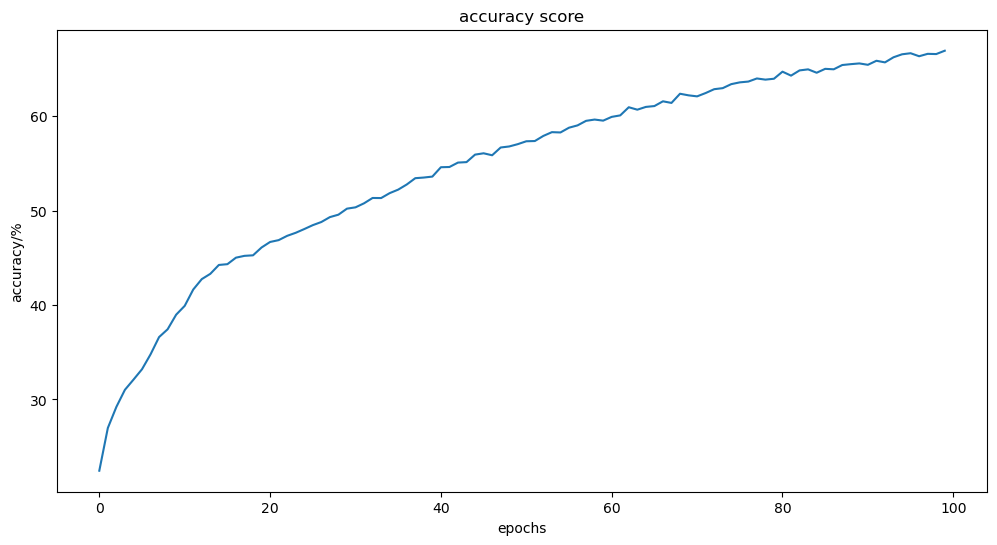

In [172]:
x_axis = [i for i in range(epoch)]
plt.figure(figsize=(12, 6))
plt.xlabel("epochs")
plt.ylabel("accuracy/%")
 
# naming the title of the plot
plt.title("accuracy score")
plt.plot(x_axis, accuracyarray);

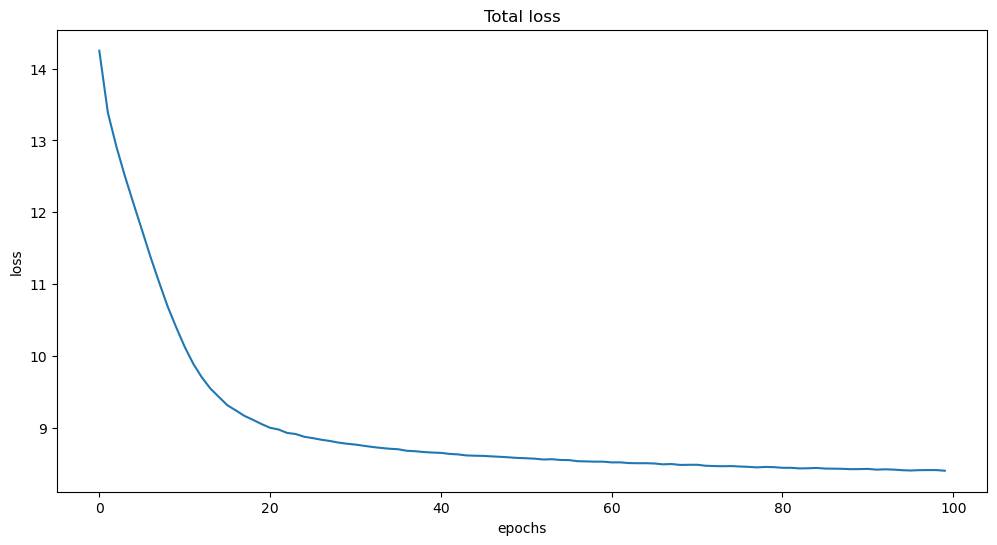

In [173]:
x_axis = [i for i in range(epoch)]
plt.figure(figsize=(12, 6))
plt.xlabel("epochs")
plt.ylabel("loss")
# naming the title of the plot
plt.title("Total loss")
plt.plot(x_axis, train_lossarray)

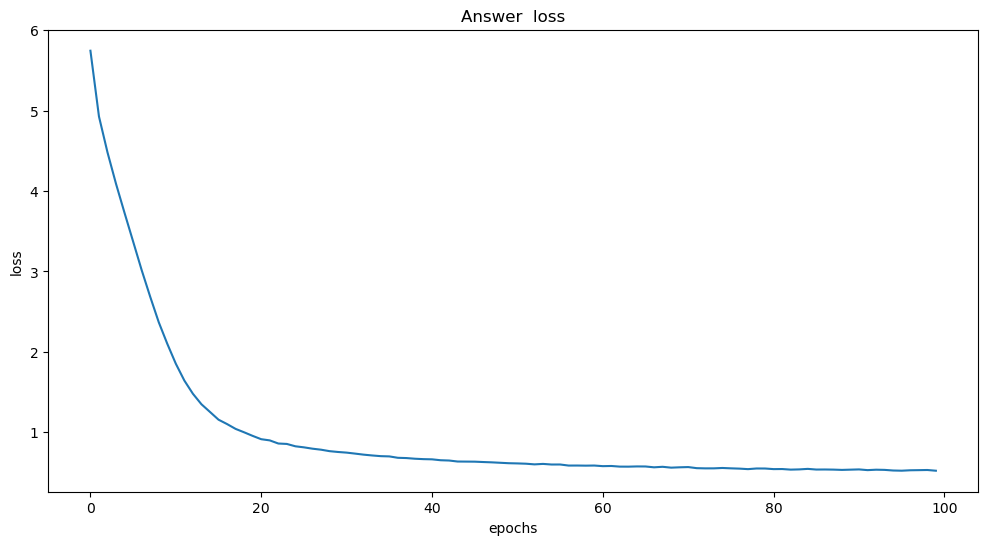

In [174]:
x_axis = [i for i in range(epoch)]
plt.figure(figsize=(12, 6))
plt.xlabel("epochs")
plt.ylabel("loss")
 
# naming the title of the plot
plt.title("Answer  loss")
plt.plot(x_axis, loss_answerarray)

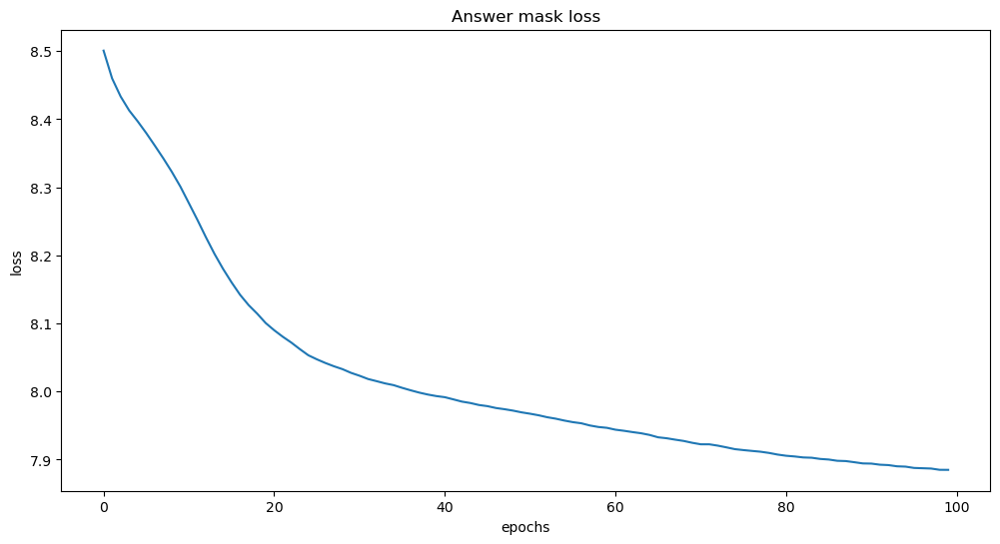

In [175]:
x_axis = [i for i in range(epoch)]
plt.figure(figsize=(12, 6))
plt.xlabel("epochs")
plt.ylabel("loss")
 
# naming the title of the plot
plt.title("Answer mask loss")
plt.plot(x_axis, loss_answer_maskarray)

In [250]:
def run_model_test(linearmodel,test_dataloader,input_dim,batchsize,train = True):
    loss = nn.CrossEntropyLoss().cuda()
    model.eval()
    test_accuracy=0
    total_loss_test=0
    total_loss_test_answer=0
    total_loss_test_answer_mask=0
    with torch.no_grad():
        for (combined_features,label) in tqdm(test_dataloader):
            answer,answer_mask = linearmodel(combined_features.cuda())
            test_answer_output= answer*answer_mask
            dim=answer.shape
            answer=torch.reshape(answer, (dim[0], dim[1])).cuda()
            answer_mask=torch.reshape(answer_mask, (dim[0], dim[1])).cuda()
            label=label.cuda()
            loss_answer = loss(answer, label)
            loss_answermask= loss(answer_mask, label)
            total=loss_answer+loss_answermask
            total_loss_test += total
            total_loss_test_answer+=loss_answer
            total_loss_test_answer_mask+=loss_answermask
            
            softmax_output = torch.nn.functional.softmax(test_answer_output, dim=1).cuda()
            max_indices = torch.argmax(softmax_output, dim=1).cuda()
            one_hot_matrix = torch.eye(answer.shape[1]).cuda()
            one_hot_answer = one_hot_matrix[max_indices].cuda()

            np_label=label.cpu().detach()
            np_answer=one_hot_answer.cpu().detach()
            answer_accuracy=accuracy_score(np_label, np_answer)
            test_accuracy+=answer_accuracy 
    
    return (test_accuracy/len(test_dataloader))*100,(total_loss_test/len(test_dataloader)),(total_loss_test_answer/len(test_dataloader)),(total_loss_test_answer_mask/len(test_dataloader))
    
    

In [251]:
epoch = 1
for e in range(epoch):
    accuracy,loss,answer_loss,answermask_loss=run_model_test(linear_classifier,test_dataloader,input_dim,batchsize,optimizer)
    print(accuracy)
    print(loss)
    print(answer_loss)
    print(answermask_loss)

 12%|█▏        | 2/17 [00:00<00:02,  6.91it/s]

0.0
0.0


 24%|██▎       | 4/17 [00:00<00:02,  6.13it/s]

0.0
0.0


 35%|███▌      | 6/17 [00:00<00:01,  6.58it/s]

0.0
0.0


 47%|████▋     | 8/17 [00:01<00:01,  6.83it/s]

0.0
0.0


 59%|█████▉    | 10/17 [00:01<00:01,  6.91it/s]

0.0
0.0


 71%|███████   | 12/17 [00:01<00:00,  7.01it/s]

0.0
0.0


 82%|████████▏ | 14/17 [00:02<00:00,  7.01it/s]

0.0
0.0


 94%|█████████▍| 16/17 [00:02<00:00,  7.00it/s]

0.0
0.0


100%|██████████| 17/17 [00:02<00:00,  6.92it/s]

0.0
0.0
tensor(-138274.6591, device='cuda:0', dtype=torch.float64)
tensor(-90929.5759, device='cuda:0', dtype=torch.float64)
tensor(-47345.0831, device='cuda:0', dtype=torch.float64)


In [178]:
def model_predict(linearmodel,test_case_image,test_case_question,encoder):
    text_features=model.encode_text(clip.tokenize(test_case_question).cuda()).cuda()
    image_features=model.encode_image(preprocess(image).unsqueeze(0).cuda()).cuda()
    combined_features=torch.cat([image_features,text_features], dim=-1).cuda()
    
    answer,answer_mask = linearmodel(combined_features.cuda())
    
    index=torch.argmax(answer*answer_mask, axis=None)
    answer=np.zeros([1, one_hot_encoded_train.shape[1]])
    answer[0,index]=1
    
    return one_hot_encoder.inverse_transform(answer)

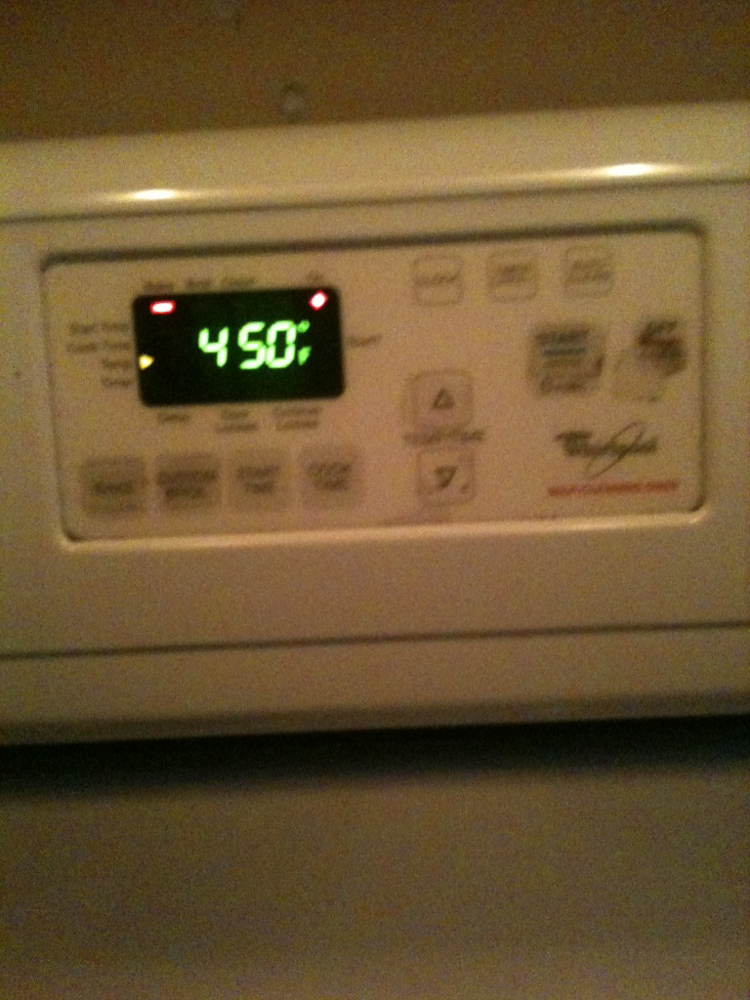

In [200]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000002.jpg"
Image.open(testcase_path)

In [202]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000002.jpg"
image=Image.open(testcase_path)
test_case_question="What is this?"
print(test_case_question)
test_case_image=image
print(model_predict(linear_classifier,test_case_image,test_case_question,one_hot_encoder))

What is this?
[['alarm clock']]


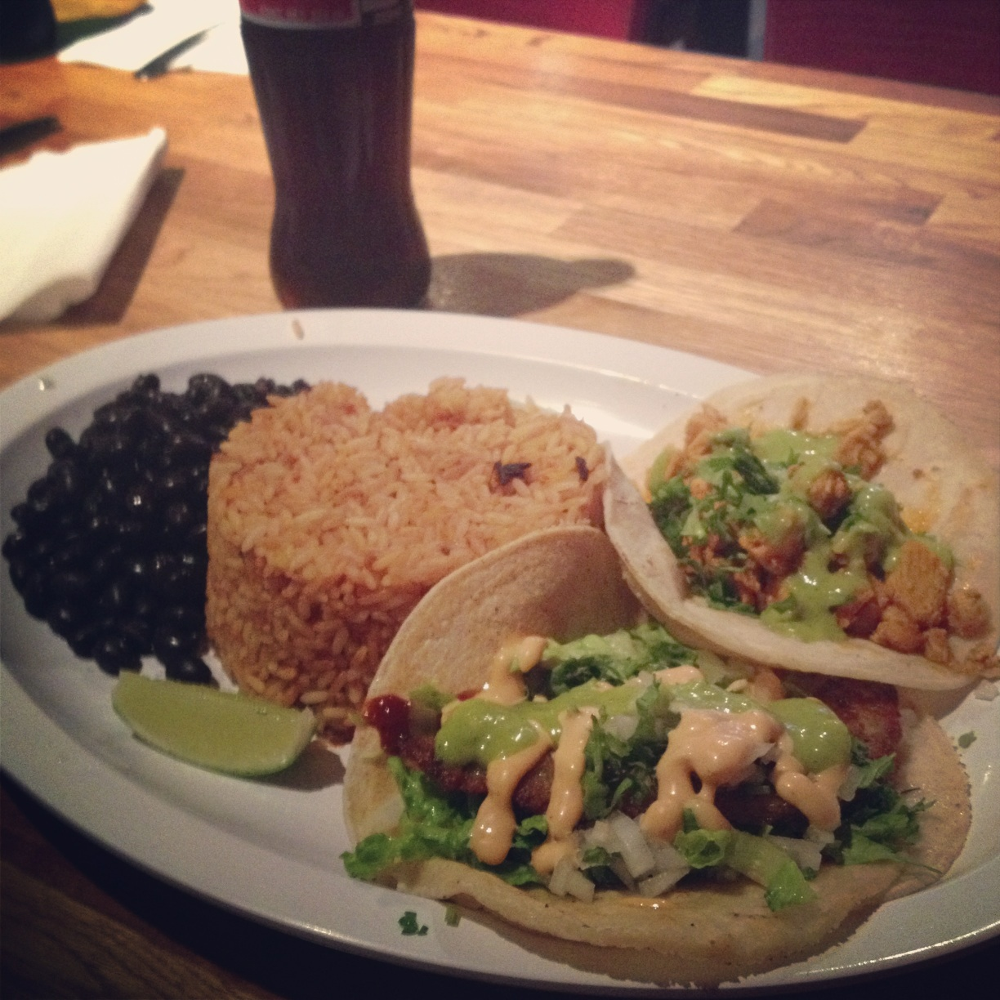

In [205]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000009.jpg"
Image.open(testcase_path)

In [230]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000009.jpg"
image=Image.open(testcase_path)
test_case_question="What is this?"
print(test_case_question)
test_case_image=image
print(model_predict(linear_classifier,test_case_image,test_case_question,one_hot_encoder))

What is this?
[['food']]


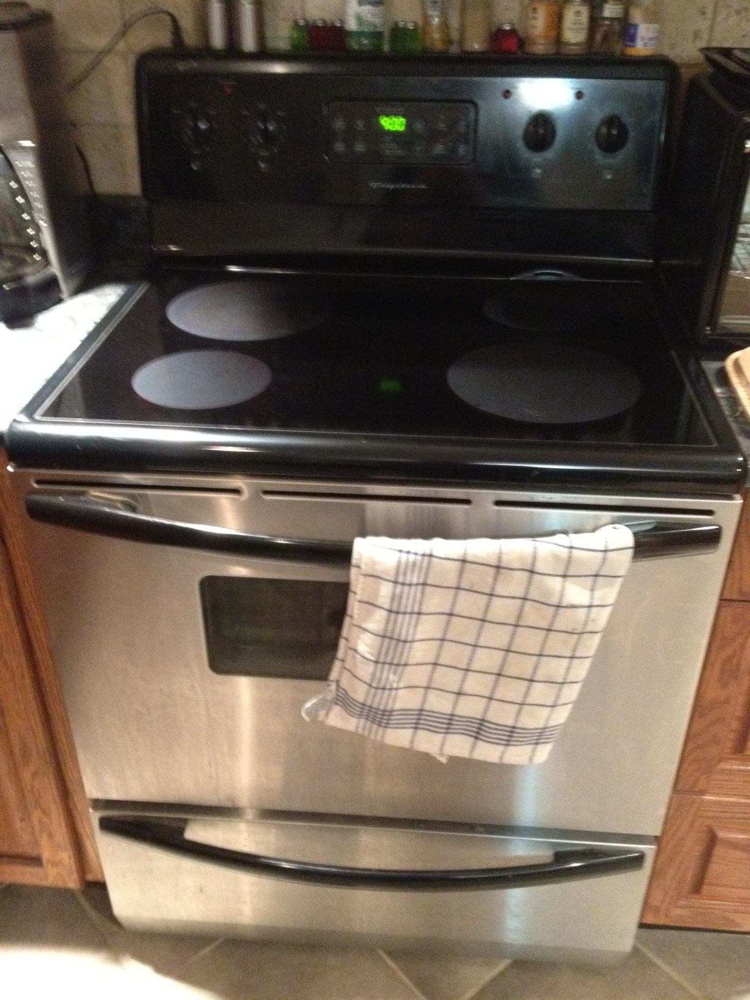

In [232]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000011.jpg"
Image.open(testcase_path)

In [233]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000011.jpg"
image=Image.open(testcase_path)
test_case_question="What is this?"
print(test_case_question)
test_case_image=image
print(model_predict(linear_classifier,test_case_image,test_case_question,one_hot_encoder))

What is this?
[['stove']]


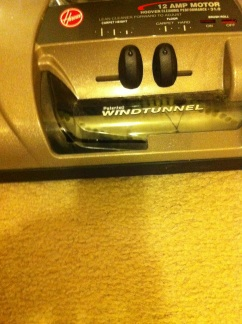

In [234]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000014.jpg"
Image.open(testcase_path)

In [237]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_0000001.jpg"
image=Image.open(testcase_path)
test_case_question="What is this?"
print(test_case_question)
test_case_image=image
print(model_predict(linear_classifier,test_case_image,test_case_question,one_hot_encoder))

What is this?
[['speaker']]


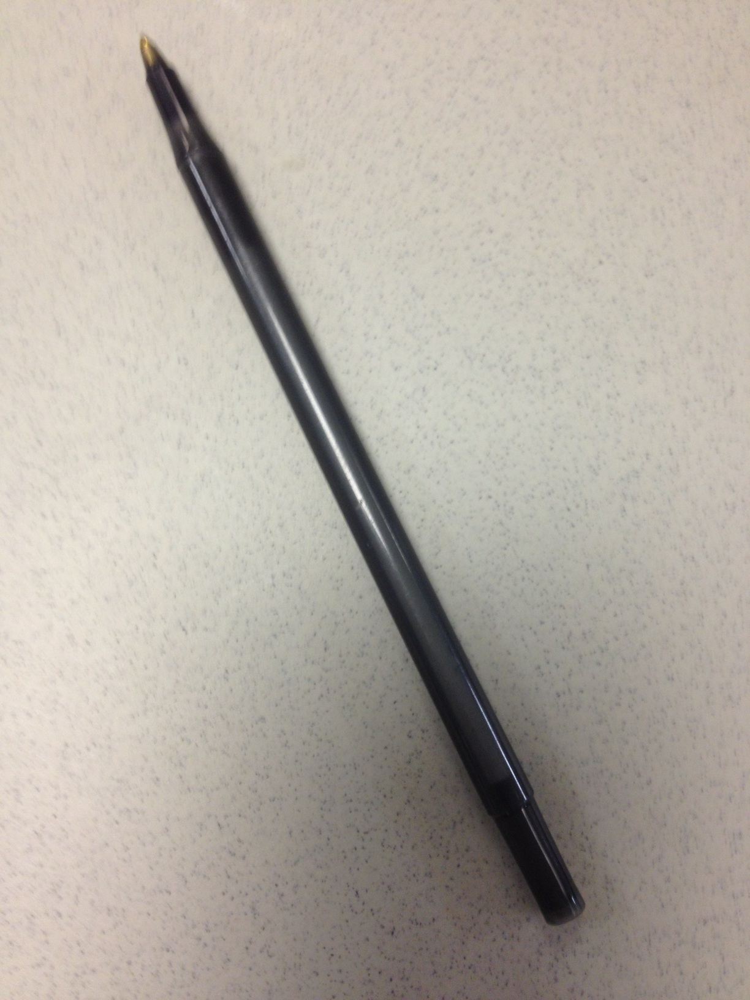

In [246]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000085.jpg"
Image.open(testcase_path)

In [248]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000085.jpg"
image=Image.open(testcase_path)
test_case_question="What is this?"
print(test_case_question)
test_case_image=image
print(model_predict(linear_classifier,test_case_image,test_case_question,one_hot_encoder))

What is this?
[['pen']]


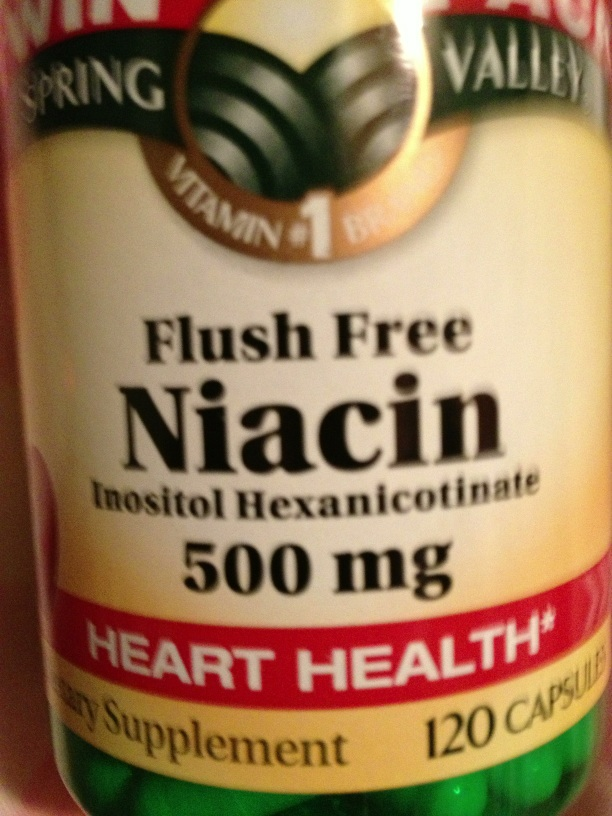

In [263]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000299.jpg"
Image.open(testcase_path)

In [264]:
testcase_path="/kaggle/input/vizwiz/test/test/VizWiz_test_00000299.jpg"
image=Image.open(testcase_path)
test_case_question="What is this?"
print(test_case_question)
test_case_image=image
print(model_predict(linear_classifier,test_case_image,test_case_question,one_hot_encoder))

What is this?
[['niacin']]


In [270]:
import pickle
pickle.dump(linear_classifier,open("linear_classifier.h5","wb"))